In [1]:
#making some arrays for vectors 
import numpy as np
a = np.array([1,2,3])
b = np.array([6,5,3])
c = np.array([4,3,1])
print("Array a:", a, sep="\n")
print("Array b:", b, sep="\n")
print("Array c:", c, sep="\n")

Array a:
[1 2 3]
Array b:
[6 5 3]
Array c:
[4 3 1]


In [2]:
#making these into matrixis 
a = np.matrix(a)
b = np.matrix(b)
c = np.matrix(c)
print("Vector a", a, sep="\n")
print("Vector b", b, sep="\n")
print("Vector c", c, sep="\n")

Vector a
[[1 2 3]]
Vector b
[[6 5 3]]
Vector c
[[4 3 1]]


In [3]:
#making a b and c one big thing by calling it mat 
mat = np.concatenate((a, b, c), axis = 0)
print("Mat:", mat, sep="\n")

Mat:
[[1 2 3]
 [6 5 3]
 [4 3 1]]


In [4]:
#inverting mat
mat_inverse = mat.getI()
print("Mat inverse:", mat_inverse, sep = "\n")

Mat inverse:
[[-2.   3.5 -4.5]
 [ 3.  -5.5  7.5]
 [-1.   2.5 -3.5]]


In [5]:
#just going to round the values so we can understnad them 
mat_inverse = np.round(mat.getI(), 2)
print("mat Inverse:", mat_inverse, sep = "\n")

mat Inverse:
[[-2.   3.5 -4.5]
 [ 3.  -5.5  7.5]
 [-1.   2.5 -3.5]]


In [6]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
#this is where the data is imported
data = pd.read_csv("fraserDataWithRGDPPC.csv", 
                   index_col = [0,1], 
                   parse_dates = True)
data

EFW  Size of Government  \
ISO_Code Year                                       
ALB      2017-01-01  7.673511            7.528167   
         2016-01-01  7.637742            7.875862   
         2015-01-01  7.639666            7.904257   
         2014-01-01  7.586769            7.882037   
         2013-01-01  7.389525            7.807904   
...                       ...                 ...   
ZWE      2000-01-01  4.299839            5.365058   
         1995-01-01  5.518614            6.418859   
         1990-01-01  4.516140            5.108843   
         1985-01-01  4.226841            5.026250   
         1980-01-01  4.054740            6.322625   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
ALB      2017-01-01                        5.064907     9.648271   
         2016-01-01                        5.071814     9.553657   
         2015-01-01                        5.003489     9.585625   
         2014-01-01                        4.666740     9.629320   
         2013-01-01                        4.543782     9.690942   
...                                             ...          ...   
ZWE      2000-01-01                        4.662445     2.891166   
         1995-01-01                        5.138131     4.915293   
         1990-01-01                        3.439437     5.664840   
         1985-01-01                        2.633492     6.305850   
         1980-01-01                        1.379602     6.343342   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
ALB      2017-01-01                          8.343863    7.782349   
         2016-01-01                          8.214900    7.472476   
         2015-01-01                          8.109118    7.595838   
         2014-01-01                          8.208630    7.547119   
         2013-01-01                          7.705771    7.199224   
...                                               ...         ...   
ZWE      2000-01-01                          3.224735    5.355792   
         1995-01-01                          5.839664    5.423290   
         1990-01-01                          4.689623    3.953668   
         1985-01-01                          3.161743    4.207229   
         1980-01-01                          3.277015    3.280637   

                     RGDP Per Capita  
ISO_Code Year                         
ALB      2017-01-01              NaN  
         2016-01-01          11285.0  
         2015-01-01          10947.0  
         2014-01-01          10703.0  
         2013-01-01          10138.0  
...                              ...  
ZWE      2000-01-01           2696.0  
         1995-01-01           2841.0  
         1990-01-01           3265.0  
         1985-01-01           3615.0  
         1980-01-01           4003.0  

[3030 rows x 7 columns]

In [7]:
years = np.array(sorted(list(set(data.index.get_level_values("Year")))))
#line 1 and 4 sort the data 
years = pd.date_range(years[0], years[-2], freq = "AS")
countries = sorted(list(set(data.index.get_level_values("ISO_Code"))))
index_names = list(data.index.names)
multi_index = pd.MultiIndex.from_product(
    [countries, years[:-1]], names = data.index.names)
# the above line is doing a list slice to remove the last year 
data = data.reindex(multi_index)

data

EFW  Size of Government  \
ISO_Code Year                                       
AGO      1970-01-01       NaN                 NaN   
         1971-01-01       NaN                 NaN   
         1972-01-01       NaN                 NaN   
         1973-01-01       NaN                 NaN   
         1974-01-01       NaN                 NaN   
...                       ...                 ...   
ZWE      2011-01-01  4.843441            6.424630   
         2012-01-01  4.971192            6.670469   
         2013-01-01  5.246723            6.325105   
         2014-01-01  5.582478            6.433165   
         2015-01-01  6.145330            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      1970-01-01                             NaN          NaN   
         1971-01-01                             NaN          NaN   
         1972-01-01                             NaN          NaN   
         1973-01-01                             NaN          NaN   
         1974-01-01                             NaN          NaN   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      1970-01-01                               NaN         NaN   
         1971-01-01                               NaN         NaN   
         1972-01-01                               NaN         NaN   
         1973-01-01                               NaN         NaN   
         1974-01-01                               NaN         NaN   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     RGDP Per Capita  
ISO_Code Year                         
AGO      1970-01-01              NaN  
         1971-01-01              NaN  
         1972-01-01              NaN  
         1973-01-01              NaN  
         1974-01-01              NaN  
...                              ...  
ZWE      2011-01-01           1515.0  
         2012-01-01           1623.0  
         2013-01-01           1801.0  
         2014-01-01           1797.0  
         2015-01-01           1759.0  

[7452 rows x 7 columns]

In [8]:
data["RGDP Per Capita Lag"] = data.groupby("ISO_Code")["RGDP Per Capita"].shift()

In [9]:
data = data.dropna(axis=0)
data.loc["GBR"]

,EFW,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation,RGDP Per Capita,RGDP Per Capita Lag
Year,,,,,,,,
2001-01-01,8.452018,6.961156,8.234602,9.520818,9.231009,8.312506,35182.0,34390.0
2002-01-01,8.490705,7.139978,8.144261,9.484984,9.161324,8.522978,35384.0,35182.0
2003-01-01,8.499127,7.039513,8.245855,9.414910,9.236219,8.559139,35354.0,35384.0
2004-01-01,8.382597,6.920611,8.069173,9.426507,8.908917,8.587775,36320.0,35354.0
2005-01-01,8.393285,6.922756,8.265496,9.449126,8.786506,8.542543,37724.0,36320.0
2006-01-01,8.302836,6.914460,7.982602,9.395209,8.748802,8.473108,38251.0,37724.0
2007-01-01,8.192020,6.929650,7.644268,9.435705,8.686429,8.264048,38071.0,38251.0
2008-01-01,8.025975,6.161823,7.807282,9.406692,8.600234,8.153843,37657.0,38071.0
2009-01-01,8.010150,6.282977,7.979651,9.499708,8.744129,7.544287,35730.0,37657.0


In [11]:
#sets varabils for setting up reggresstion 
PerCap = ["RGDP Per Capita"]
SizeFree = ["Size of Government", 
          "Legal System & Property Rights", 
          "Sound Money",
          "Freedom to trade internationally",
          "Regulation"]
reg_vars = PerCap + SizeFree
reg_data = data[reg_vars]
reg_data.corr().round(2)


,RGDP Per Capita,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation
RGDP Per Capita,1.00,-0.23,0.70,0.46,0.53,0.52
Size of Government,-0.23,1.00,-0.17,0.11,0.14,0.08
Legal System & Property Rights,0.70,-0.17,1.00,0.59,0.68,0.66
Sound Money,0.46,0.11,0.59,1.00,0.75,0.57
Freedom to trade internationally,0.53,0.14,0.68,0.75,1.00,0.65
Regulation,0.52,0.08,0.66,0.57,0.65,1.00


In [13]:
y = reg_data[PerCap]
X = reg_data[SizeFree]
X["Constant"] = 1
results = sm.OLS(y, X).fit()

In [14]:
predictor = results.predict()
reg_data[PerCap[0] + " Predictor"] = predictor
reg_data

<ipython-input-14-42218a6f6ee8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data[PerCap[0] + " Predictor"] = predictor


RGDP Per Capita  Size of Government  \
ISO_Code Year                                              
AGO      2006-01-01           4558.0            5.342913   
         2007-01-01           5314.0            5.239228   
         2008-01-01           6318.0            5.307379   
         2009-01-01           5212.0            7.104953   
         2010-01-01           6408.0            5.738678   
...                              ...                 ...   
ZWE      2011-01-01           1515.0            6.424630   
         2012-01-01           1623.0            6.670469   
         2013-01-01           1801.0            6.325105   
         2014-01-01           1797.0            6.433165   
         2015-01-01           1759.0            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      2006-01-01                        3.546463     4.061198   
         2007-01-01                        3.569182     4.453327   
         2008-01-01                        3.654098     5.032836   
         2009-01-01                        3.622792     5.238259   
         2010-01-01                        3.672884     5.570226   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      2006-01-01                          6.158949    5.306135   
         2007-01-01                          6.115462    5.524626   
         2008-01-01                          5.687976    5.221726   
         2009-01-01                          5.811844    5.011598   
         2010-01-01                          6.189831    5.692320   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     RGDP Per Capita Predictor  
ISO_Code Year                                   
AGO      2006-01-01                4151.911861  
         2007-01-01                5184.020640  
         2008-01-01                4453.935212  
         2009-01-01               -1005.150586  
         2010-01-01                5428.259304  
...                                        ...  
ZWE      2011-01-01                 -74.767701  
         2012-01-01               -1505.941757  
         2013-01-01                -764.881314  
         2014-01-01                 593.397823  
         2015-01-01                6969.081243  

[1999 rows x 7 columns]

In [15]:
#creates y_hat to estimate response
y_hat = reg_data[PerCap[0] + " Predictor"]
#sets the average of y to a variable 
y_mean = reg_data[PerCap[0]].mean()
y = reg_data[y_var[0]]
reg_data["Residuals"] = (y.sub(y_hat))
reg_data["Squared Explained"] = y_hat.sub(y_mean) ** 2
reg_data["Squared Residuals"] = (y.sub(y_hat)) ** 2
reg_data["Squared Totals"] = (y.sub(y_mean)) ** 2
reg_data

RGDP Per Capita  Size of Government  \
ISO_Code Year                                              
AGO      2006-01-01           4558.0            5.342913   
         2007-01-01           5314.0            5.239228   
         2008-01-01           6318.0            5.307379   
         2009-01-01           5212.0            7.104953   
         2010-01-01           6408.0            5.738678   
...                              ...                 ...   
ZWE      2011-01-01           1515.0            6.424630   
         2012-01-01           1623.0            6.670469   
         2013-01-01           1801.0            6.325105   
         2014-01-01           1797.0            6.433165   
         2015-01-01           1759.0            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      2006-01-01                        3.546463     4.061198   
         2007-01-01                        3.569182     4.453327   
         2008-01-01                        3.654098     5.032836   
         2009-01-01                        3.622792     5.238259   
         2010-01-01                        3.672884     5.570226   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      2006-01-01                          6.158949    5.306135   
         2007-01-01                          6.115462    5.524626   
         2008-01-01                          5.687976    5.221726   
         2009-01-01                          5.811844    5.011598   
         2010-01-01                          6.189831    5.692320   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     RGDP Per Capita Predictor    Residuals  \
ISO_Code Year                                                 
AGO      2006-01-01                4151.911861   406.088139   
         2007-01-01                5184.020640   129.979360   
         2008-01-01                4453.935212  1864.064788   
         2009-01-01               -1005.150586  6217.150586   
         2010-01-01                5428.259304   979.740696   
...                                        ...          ...   
ZWE      2011-01-01                 -74.767701  1589.767701   
         2012-01-01               -1505.941757  3128.941757   
         2013-01-01                -764.881314  2565.881314   
         2014-01-01                 593.397823  1203.602177   
         2015-01-01                6969.081243 -5210.081243   

                     Squared Explained  Squared Residuals  Squared Totals  
ISO_Code Year                                                              
AGO      2006-01-01       1.675332e+08       1.649076e+05    1.571857e+08  
         2007-01-01       1.418803e+08       1.689463e+04    1.388007e+08  
         2008-01-01       1.598059e+08       3.474738e+06    1.161518e+08  
         2009-01-01       3.276289e+08       3.865296e+07    1.412145e+08  
         2010-01-01       1.361215e+08       9.598918e+05    1.142199e+08  
...                                ...                ...             ...  
ZWE      2011-01-01       2.9

In [16]:
SSR = reg_data["Squared Explained"].sum()
SSE = reg_data["Squared Residuals"].sum()
SST = reg_data["Squared Totals"].sum()
SSR,SSE,SST

(348757404368.6792, 316460630908.4151, 665218035277.0935)

In [17]:
n = results.nobs
k = len(results.params)
estimator_variance = SSE / (n - k)
n, k, estimator_variance

(1999.0, 6, 158786066.6876142)

In [18]:
cov_matrix = results.cov_params()
cov_matrix

,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation,Constant
Size of Government,77715.470236,29188.296685,-4798.846268,-25363.030666,-15039.156189,-3.399061e+05
Legal System & Property Rights,29188.296685,71763.400017,-9413.828052,-41148.870798,-41010.256094,7.916107e+04
Sound Money,-4798.846268,-9413.828052,81811.193479,-62957.760525,-10704.748793,-5.682854e+04
Freedom to trade internationally,-25363.030666,-41148.870798,-62957.760525,182100.128625,-36605.070575,-1.534985e+05
Regulation,-15039.156189,-41010.256094,-10704.748793,-36605.070575,154899.592409,-3.999317e+05
Constant,-339906.142443,79161.065117,-56828.538535,-153498.504440,-399931.709954,6.171152e+06


In [19]:
results.params

Size of Government                  -2887.465018
Legal System & Property Rights       5277.623606
Sound Money                           601.120948
Freedom to trade internationally     1654.509640
Regulation                           2055.226656
Constant                           -22674.129963
dtype: float64

In [20]:
parameters = {}
for x_var in x_vars:
    parameters[x_var] = {}
    parameters[x_var]["Beta"] = results.params[x_var]
    parameters[x_var]["Standard Error"] = cov_matrix.loc[x_var, x_var] ** (1/2)
    parameters[x_var]["t-stats"] = parameters[x_var]["Beta"] / parameters[x_var]["Standard Error"] 
parameters = pd.DataFrame(parameters).T
parameters

,Beta,Standard Error,t-stats
Size of Government,-2887.465018,278.774945,-10.357692
Legal System & Property Rights,5277.623606,267.886916,19.700938
Sound Money,601.120948,286.026561,2.101626
Freedom to trade internationally,1654.509640,426.731917,3.877164
Regulation,2055.226656,393.572855,5.221973


In [21]:
r2 = SSR/SST
r2

0.5242753291007901

In [22]:
r2_adjusted = 1 - (SSE / (n - k)) / (SST / (n - 1))
r2_adjusted

0.5230818402124315

In [23]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        RGDP Per Capita   R-squared:                       0.524
Model:                            OLS   Adj. R-squared:                  0.523
Method:                 Least Squares   F-statistic:                     439.3
Date:                Thu, 16 Dec 2021   Prob (F-statistic):          2.75e-318
Time:                        18:27:09   Log-Likelihood:                -21707.
No. Observations:                1999   AIC:                         4.343e+04
Df Residuals:                    1993   BIC:                         4.346e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Size of Government               -2887.4650    278.775    -10.358      0.000   -3434.186   -2340.744
Legal System & Property Rights    5277.6236    267.887     19.701      0.000    4752.256    5802.991
Sound Money                        601.1209    286.027      2.102      0.036      40.179    1162.063
Freedom to trade internationally  1654.5096    426.732      3.877      0.000     817.622    2491.397
Regulation                        2055.2267    393.573      5.222      0.000    1283.369    2827.084
Constant                         -2.267e+04   2484.180     -9.127      0.000   -2.75e+04   -1.78e+04
==============================================================================
Omnibus:                     1593.433   Durbin-Watson:                   0.248
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            55497.369
Skew:                           3.475   Prob(JB):                         0.00
Kurtosis:                      27.860   Cond. No.                         137.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

(array([-50000., -25000.,      0.,  25000.,  50000.,  75000., 100000.,
        125000., 150000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

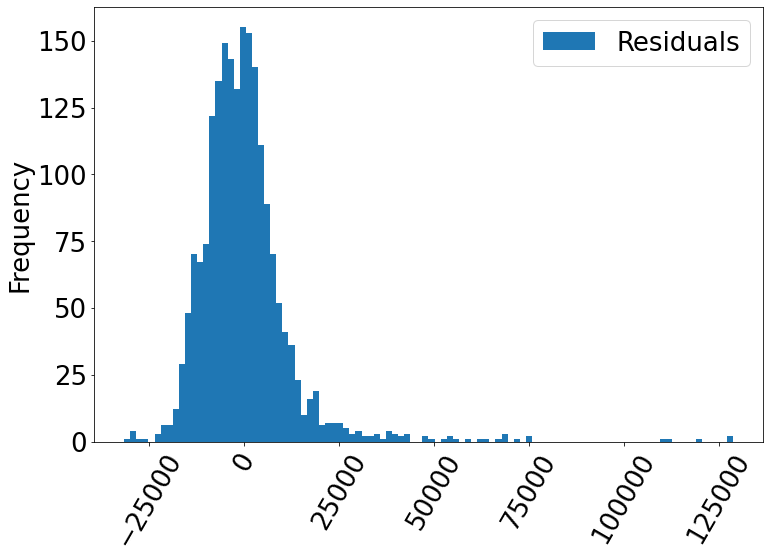

In [24]:
import matplotlib.pyplot as plt
plt.rcParams.update({"font.size":26})
fig, ax = plt.subplots(figsize = (12,8))
reg_data[["Residuals"]].plot.hist(bins = 100, ax = ax)
plt.xticks(rotation=60)

<AxesSubplot:ylabel='Frequency'>

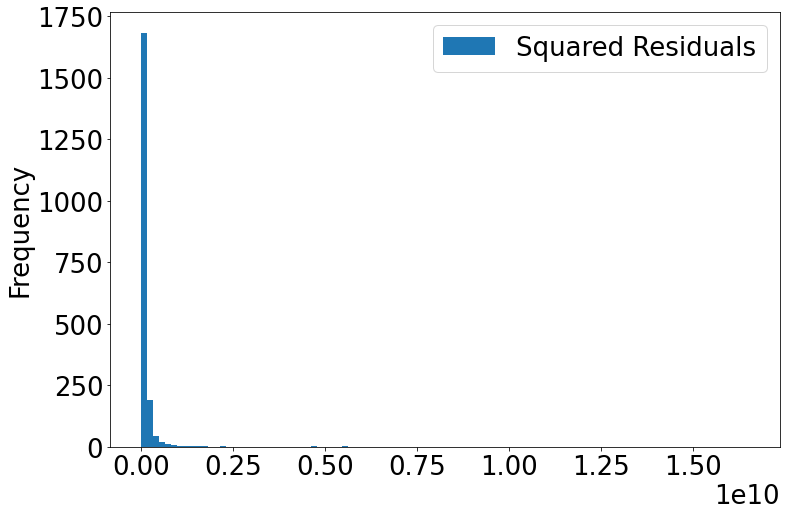

In [25]:
fig, ax = plt.subplots(figsize = (12,8))
reg_data[["Squared Residuals"]].plot.hist(bins =100, ax = ax)

<ipython-input-27-a6f847962053>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (16,8))
C:\Users\The Grand Tabaxi\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1167: UserWarning: Attempting to set identical left == right == 45.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
C:\Users\The Grand Tabaxi\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1167: UserWarning: Attempting to set identical left == right == 45.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
C:\Users\The Grand Tabaxi\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1167: UserWarning: Attempting to set identical left == right == 45.

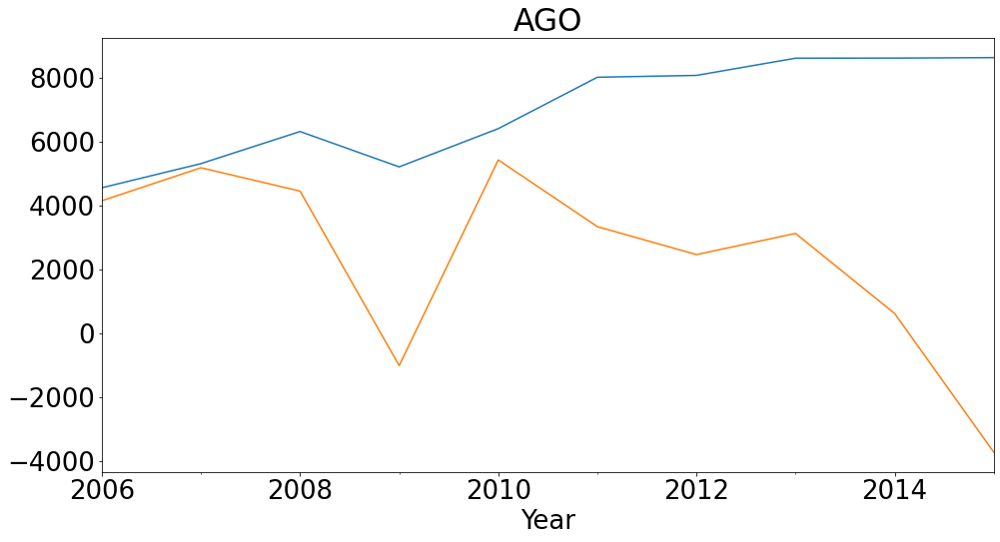

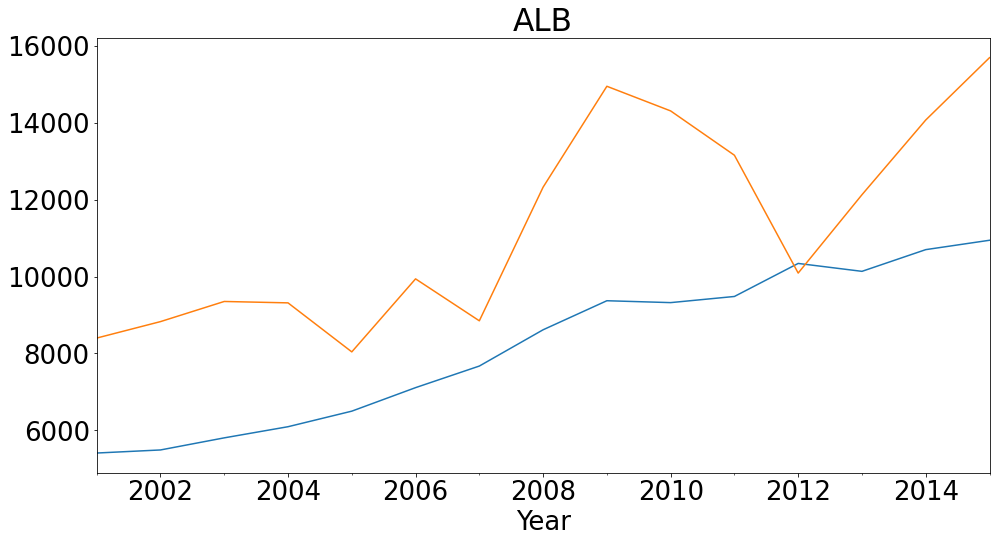

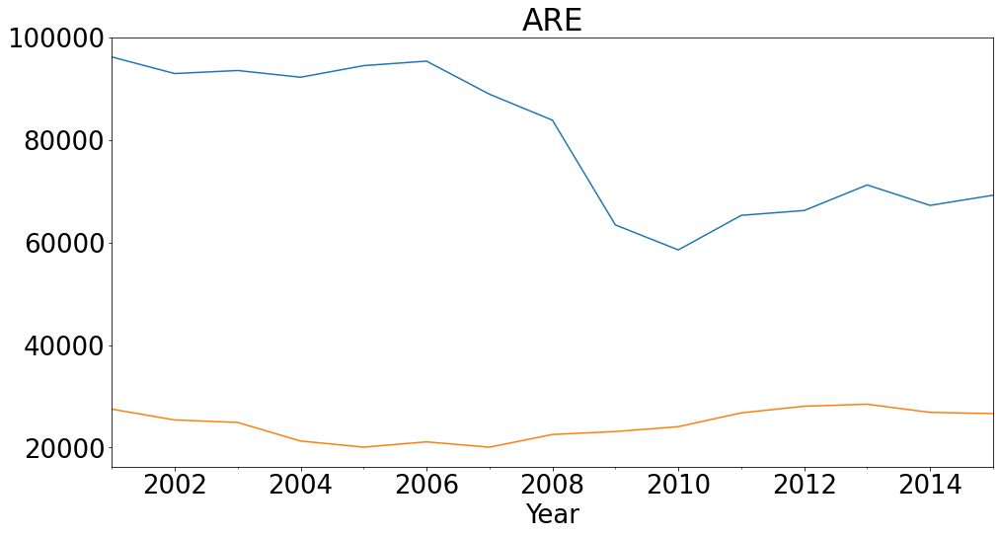

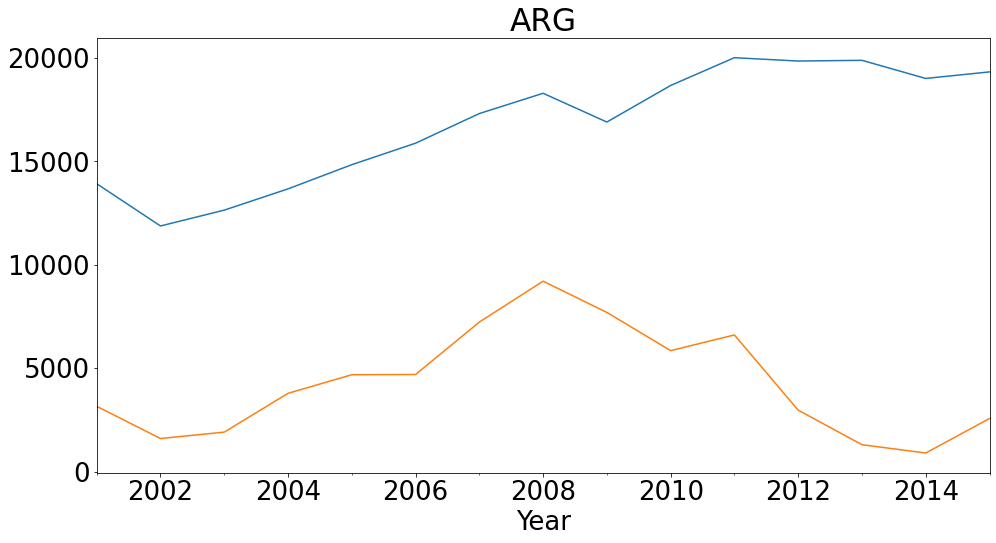

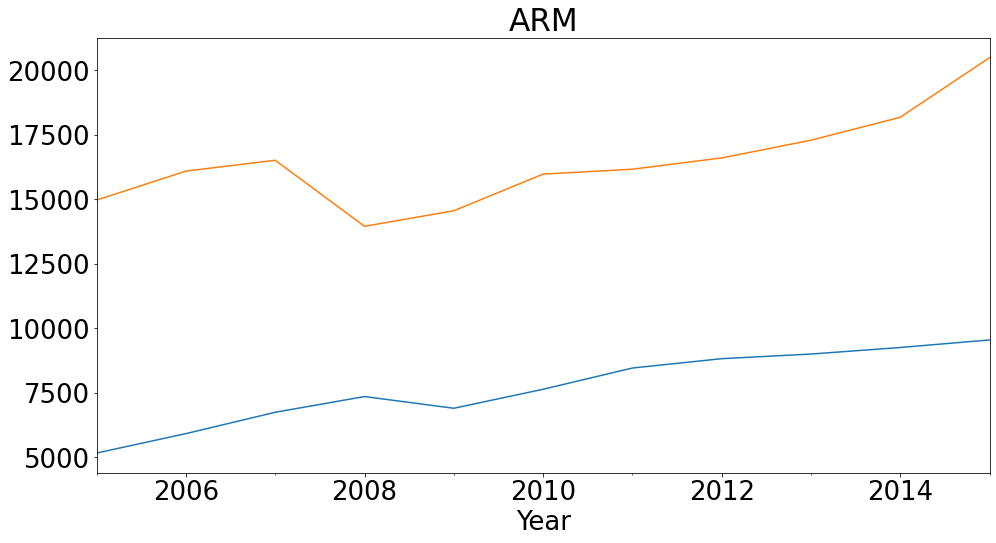

...

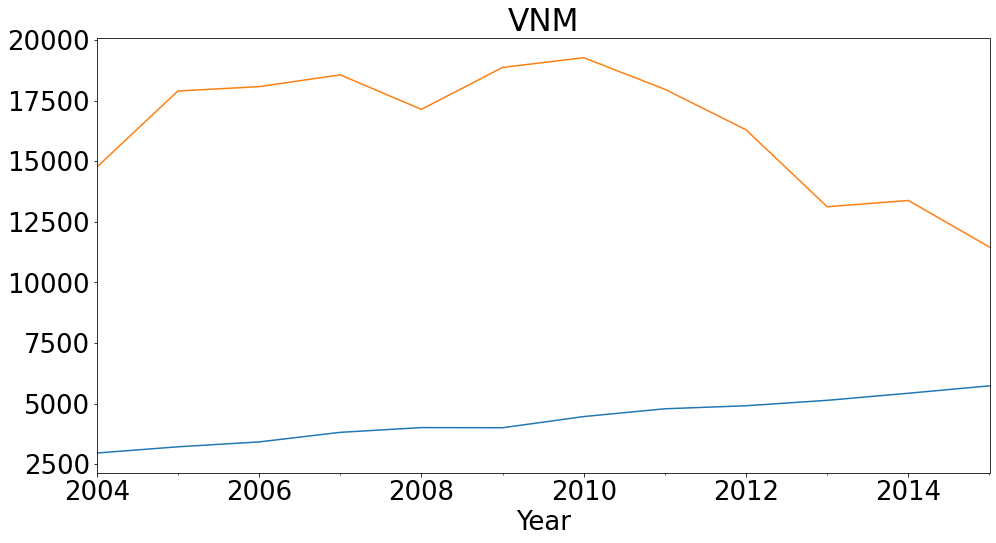

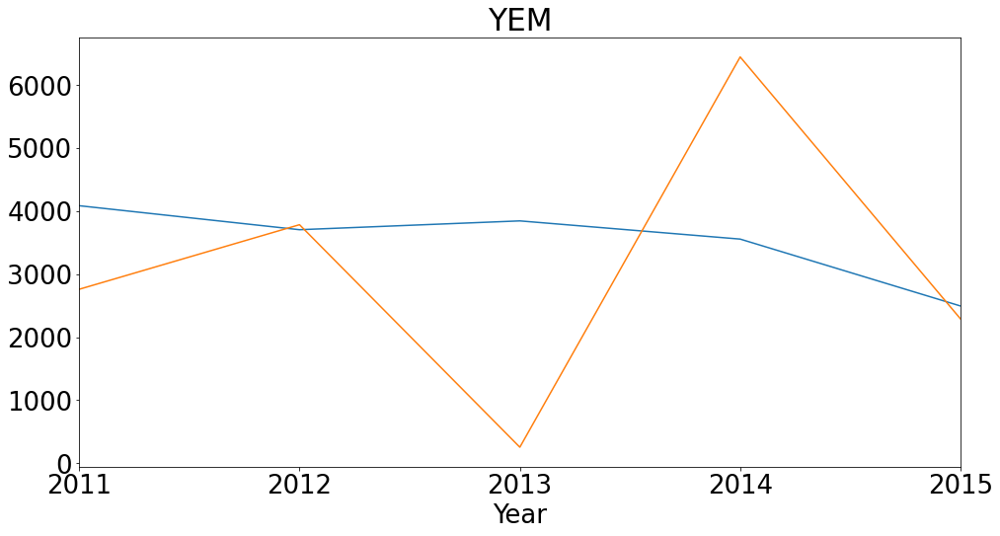

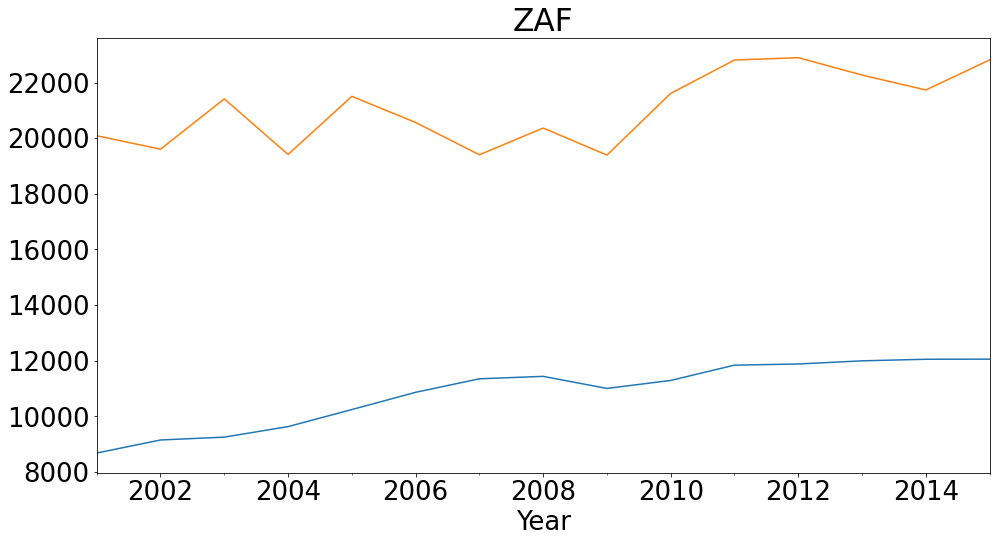

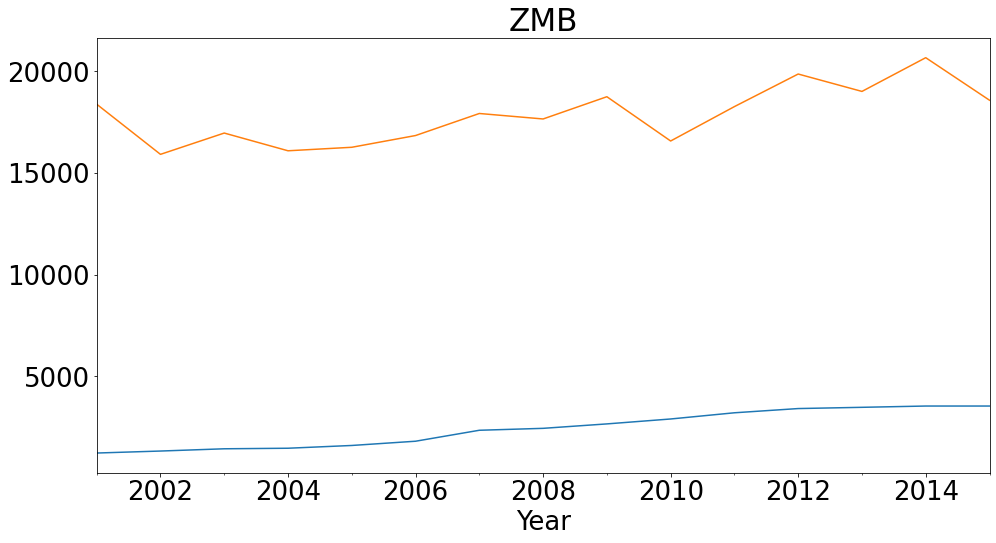

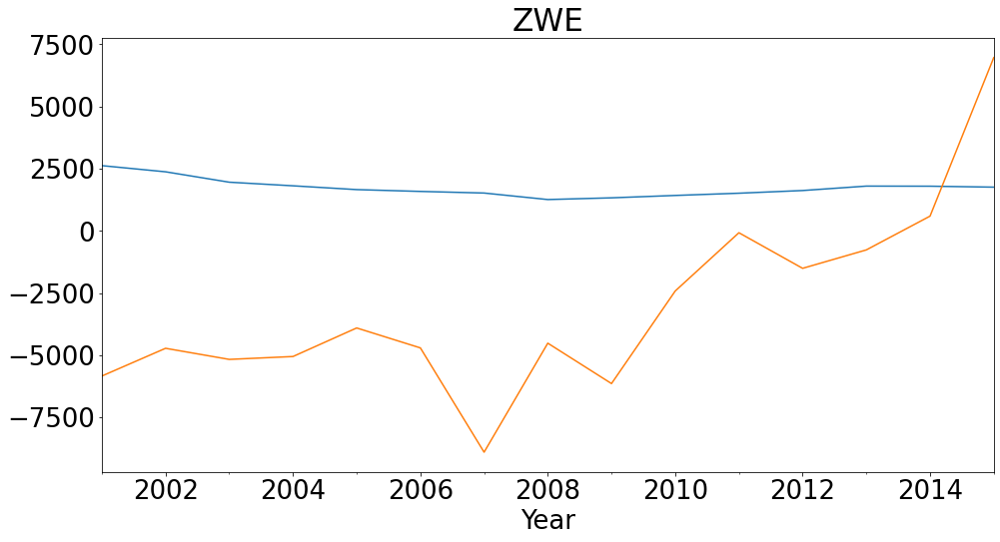

In [27]:
countries = data.groupby("ISO_Code").mean().index
for country in countries:
    #set figsize so you can see with no scrolling 
    fig, ax = plt.subplots(figsize = (16,8))
    reg_data[y_var + [y_var[0] + " Predictor"]].loc[country].plot.line(ax = ax, legend = False)    
    ax.set_title(country)

In [28]:
reg_data = data
reg_data["RGDP Per Capita"] = data.groupby("ISO_Code")["RGDP Per Capita"].pct_change() 
reg_data["RGDP Per Capita Lag"] = reg_data["RGDP Per Capita"].shift() 
reg_data = reg_data.replace([np.inf, -np.inf], np.nan).dropna(axis = 0, how = "any")
reg_data.loc["USA"]

<ipython-input-28-5bb3531fd236>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["RGDP Per Capita"] = data.groupby("ISO_Code")["RGDP Per Capita"].pct_change()
<ipython-input-28-5bb3531fd236>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["RGDP Per Capita Lag"] = reg_data["RGDP Per Capita"].shift()


,EFW,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation,RGDP Per Capita,RGDP Per Capita Lag
Year,,,,,,,,
2003-01-01,8.454976,7.830378,7.803444,9.815523,8.142189,8.683346,0.019258,0.008479
2004-01-01,8.443225,7.717933,7.767612,9.727209,8.194439,8.808933,0.028309,0.019258
2005-01-01,8.353783,7.706034,7.540888,9.758164,8.063767,8.700063,0.023962,0.028309
2006-01-01,8.318497,7.701156,7.360503,9.655075,8.079715,8.796037,0.016816,0.023962
2007-01-01,8.394524,7.790872,7.447685,9.735613,8.114240,8.884209,0.008160,0.016816
2008-01-01,8.244885,7.496386,7.409211,9.686262,7.998733,8.633830,-0.012298,0.008160
2009-01-01,7.965853,7.147290,7.188374,9.604751,7.723552,8.165299,-0.036260,-0.012298
2010-01-01,7.972577,7.108888,7.143095,9.678239,7.720760,8.211905,0.016800,-0.036260
2011-01-01,7.906265,7.260760,6.957723,9.305630,7.711284,8.295927,0.008281,0.016800


In [30]:
#rounds the data to 3 decimal points, 
reg_data.corr().round(3)

,EFW,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation,RGDP Per Capita,RGDP Per Capita Lag
EFW,1.000,0.260,0.805,0.853,0.894,0.809,-0.039,-0.036
Size of Government,0.260,1.000,-0.166,0.107,0.146,0.086,0.054,0.049
Legal System & Property Rights,0.805,-0.166,1.000,0.595,0.671,0.662,-0.054,-0.047
Sound Money,0.853,0.107,0.595,1.000,0.763,0.571,-0.068,-0.056
Freedom to trade internationally,0.894,0.146,0.671,0.763,1.000,0.671,-0.030,-0.037
Regulation,0.809,0.086,0.662,0.571,0.671,1.000,-0.021,-0.018
RGDP Per Capita,-0.039,0.054,-0.054,-0.068,-0.030,-0.021,1.000,0.226
RGDP Per Capita Lag,-0.036,0.049,-0.047,-0.056,-0.037,-0.018,0.226,1.000


In [32]:
y_var = ["RGDP Per Capita"]
x_vars = ["Size of Government", 
          "Legal System & Property Rights", 
          "Sound Money",
          "Freedom to trade internationally",
          "Regulation",
          "RGDP Per Capita Lag"]


y = reg_data[PerCap]
X = reg_data[SizeFree]
X["Constant"] = 1
results = sm.OLS(y, X).fit()
reg_data["Predictor"] = results.predict()

<ipython-input-32-1da10cb42129>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1


In [33]:
results.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        RGDP Per Capita   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     3.301
Date:                Thu, 16 Dec 2021   Prob (F-statistic):            0.00569
Time:                        18:38:34   Log-Likelihood:                 2177.9
No. Observations:                1703   AIC:                            -4344.
Df Residuals:                    1697   BIC:                            -4311.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Size of Government                   0.0031      0.002      1.934      0.053   -4.44e-05       0.006
Legal System & Property Rights      -0.0012      0.002     -0.783      0.433      -0.004       0.002
Sound Money                         -0.0048      0.002     -2.756      0.006      -0.008      -0.001
Freedom to trade internationally     0.0028      0.003      1.094      0.274      -0.002       0.008
Regulation                           0.0015      0.002      0.625      0.532      -0.003       0.006
Constant                             0.0298      0.014      2.058      0.040       0.001       0.058
==============================================================================
Omnibus:                      229.097   Durbin-Watson:                   1.623
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2747.737
Skew:                           0.050   Prob(JB):                         0.00
Kurtosis:                       9.222   Cond. No.                         138.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<AxesSubplot:ylabel='Frequency'>

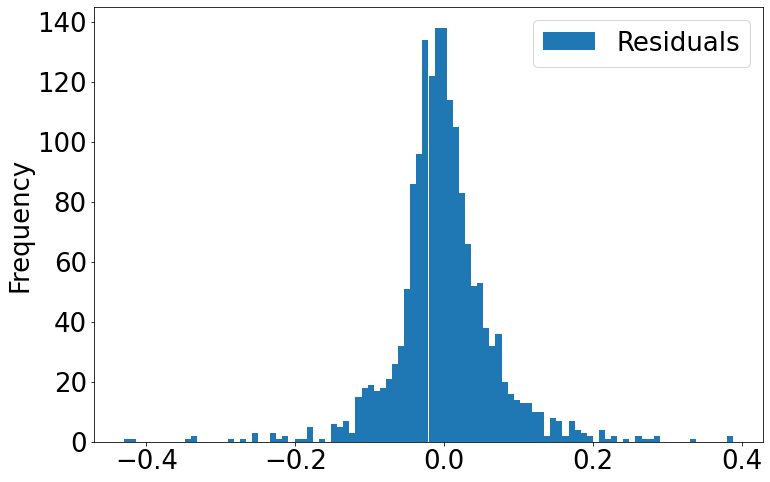

In [34]:
reg_data["Residuals"] = results.resid
fig, ax = plt.subplots(figsize = (12,8))

reg_data[["Residuals"]].plot.hist(bins = 100, ax = ax)
#really interesting kurtosos on this 

In [35]:
#gives us statistical information about the data 
betaEstimates = results.params
tStats = results.tvalues
pValues = results.pvalues
stdErrors = results.bse

resultsDict = {"Beta Estimates" : betaEstimates,
              "t-stats":tStats,
              "p-values":pValues,
              "Standard Errors":stdErrors}
resultsDF = pd.DataFrame(resultsDict)
resultsDF.round(4)

,Beta Estimates,t-stats,p-values,Standard Errors
Size of Government,0.0031,1.9339,0.0533,0.0016
Legal System & Property Rights,-0.0012,-0.7835,0.4335,0.0015
Sound Money,-0.0048,-2.7559,0.0059,0.0017
Freedom to trade internationally,0.0028,1.0938,0.2742,0.0026
Regulation,0.0015,0.6246,0.5323,0.0023
Constant,0.0298,2.0575,0.0398,0.0145


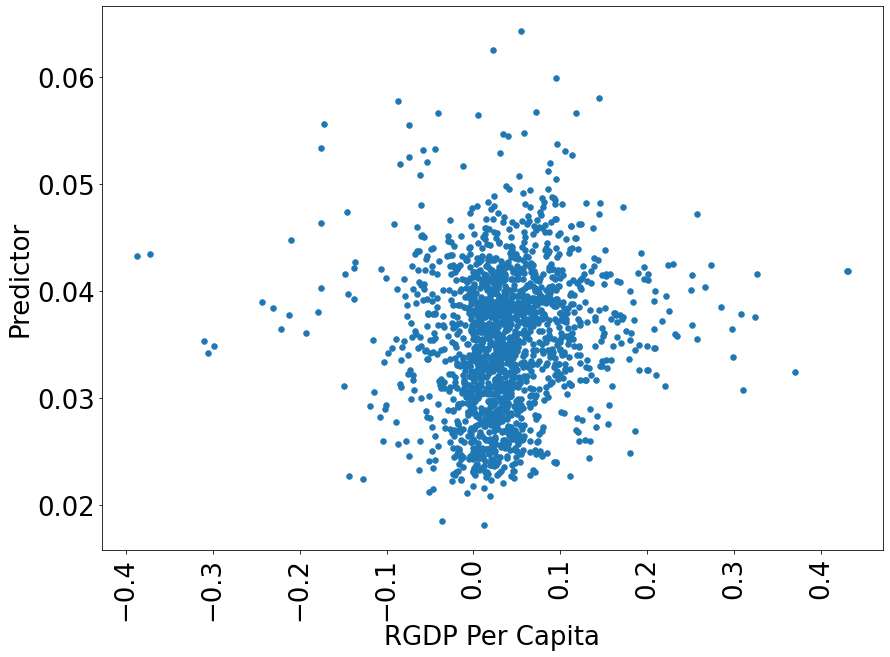

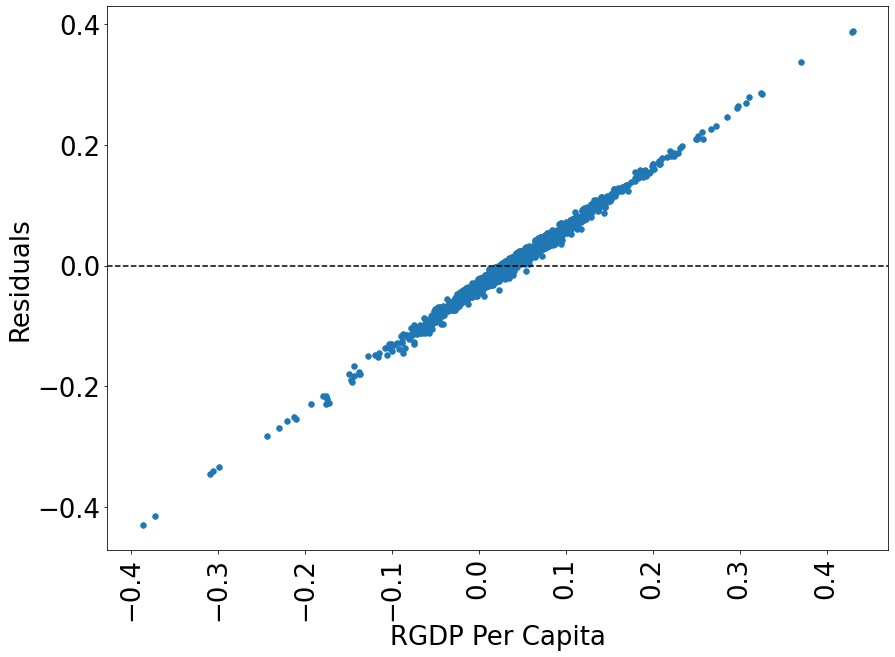

In [36]:
fig, ax = plt.subplots(figsize = (14,10))
reg_data.plot.scatter(x = y_var[0],
                 y = "Predictor", 
                  s = 30, ax = ax)
plt.xticks(rotation=90)
plt.show()
plt.close()

fig, ax = plt.subplots(figsize = (14,10))
reg_data.plot.scatter(x = y_var[0],
                 y = "Residuals", 
                  s = 30, ax = ax)
ax.axhline(0, ls = "--", color = "k")
plt.xticks(rotation=90)
plt.show()
plt.close()

In [37]:
countries = reg_data.groupby("ISO_Code").mean().index
plot_data = reg_data[y_var + ["Predictor"]]
for key in plot_data:
    plot_data[key] = plot_data[key] + 1

plot_data

<ipython-input-37-92c14819f051>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data[key] = plot_data[key] + 1


RGDP Per Capita  Predictor
ISO_Code Year                                  
AGO      2008-01-01         1.188935   1.041661
         2009-01-01         0.824945   1.046383
         2010-01-01         1.229470   1.042530
         2011-01-01         1.250936   1.041491
         2012-01-01         1.007236   1.037387
...                              ...        ...
ZWE      2011-01-01         1.063158   1.047049
         2012-01-01         1.071287   1.040006
         2013-01-01         1.109673   1.033807
         2014-01-01         0.997779   1.030111
         2015-01-01         0.978854   1.031982

[1703 rows x 2 columns]

In [38]:
plot_data.groupby("ISO_Code").cumprod().loc["GBR"][y_var + ["Predictor"]]

,RGDP Per Capita,Predictor
Year,,
2003-01-01,0.999152,1.035539
2004-01-01,1.026453,1.071210
2005-01-01,1.066132,1.107309
2006-01-01,1.081025,1.145029
2007-01-01,1.075938,1.183787
2008-01-01,1.064238,1.220469
2009-01-01,1.009778,1.257364
2010-01-01,0.992426,1.294383
2011-01-01,0.988328,1.332261


<ipython-input-39-8c648957cff3>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (16,8))


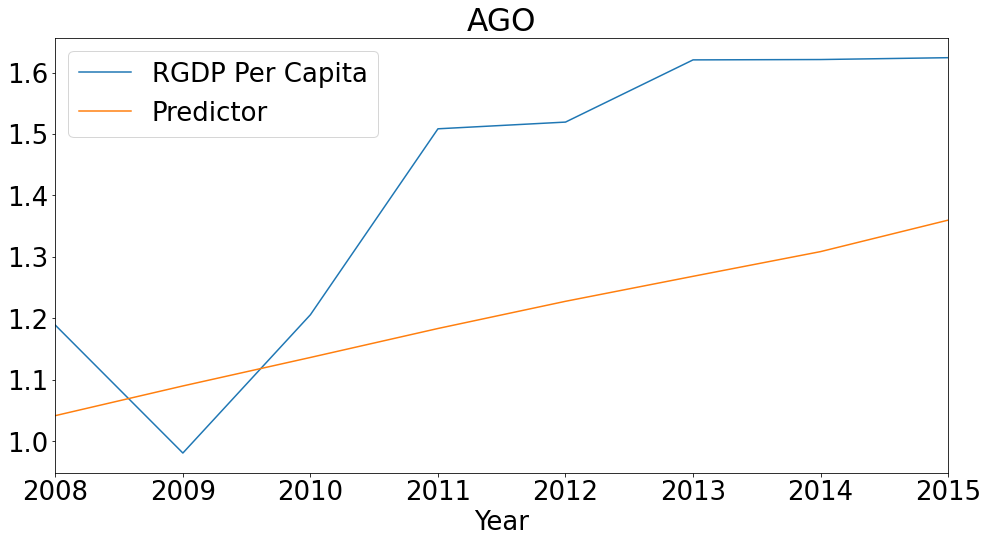

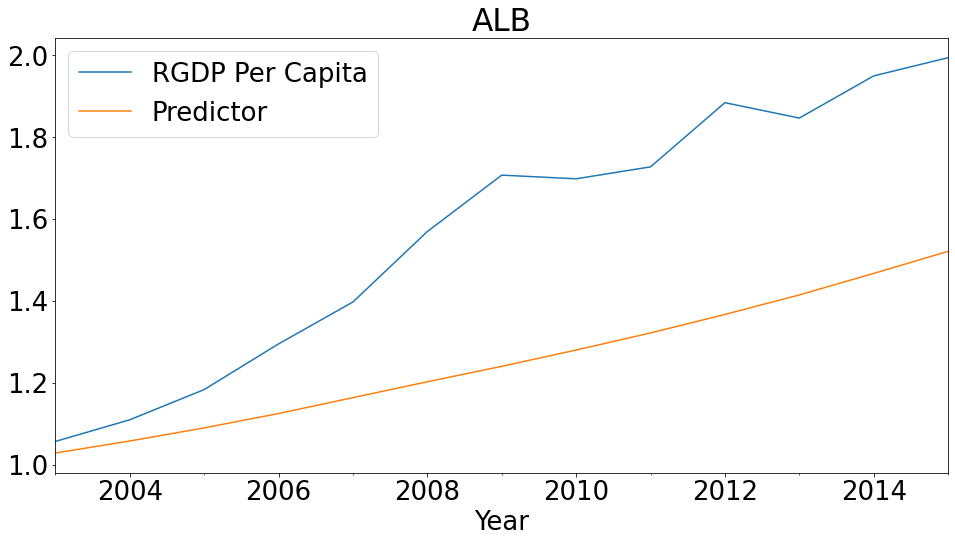

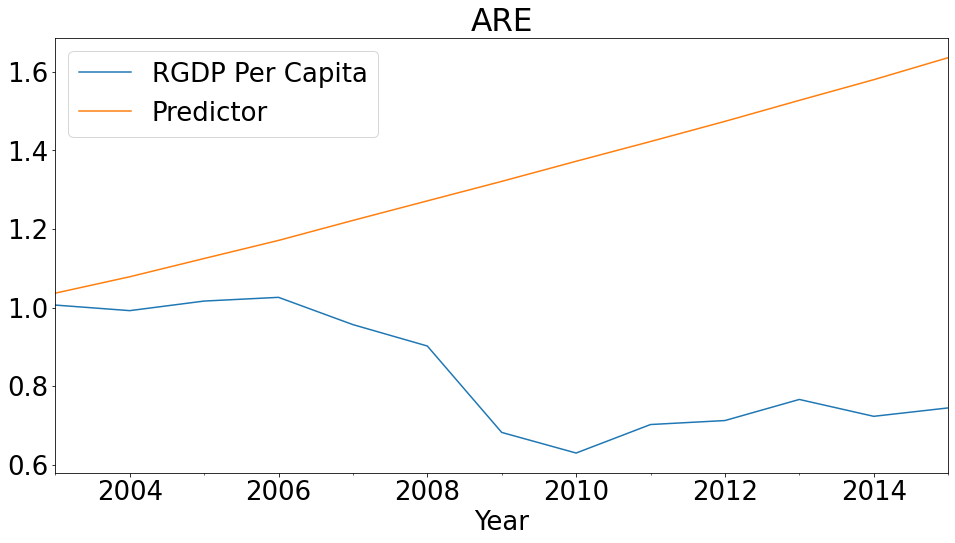

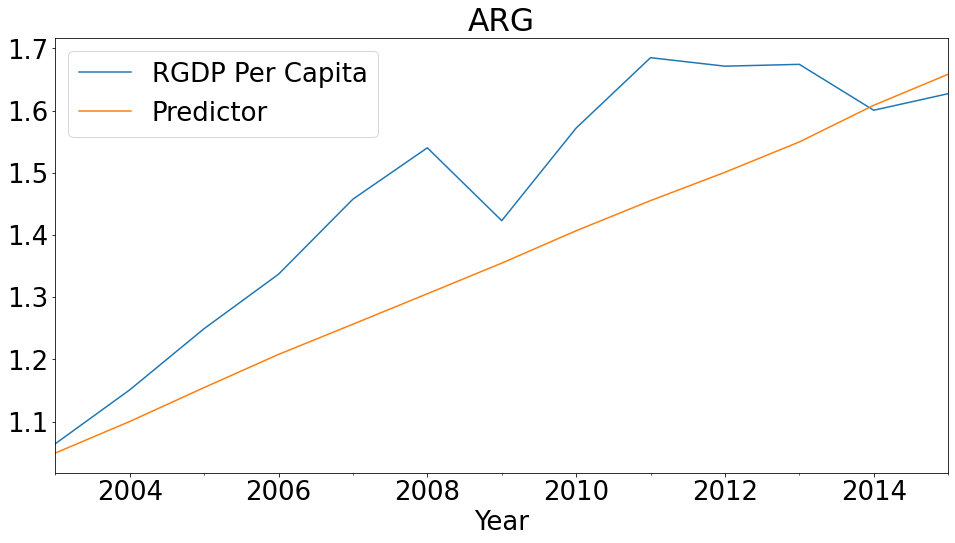

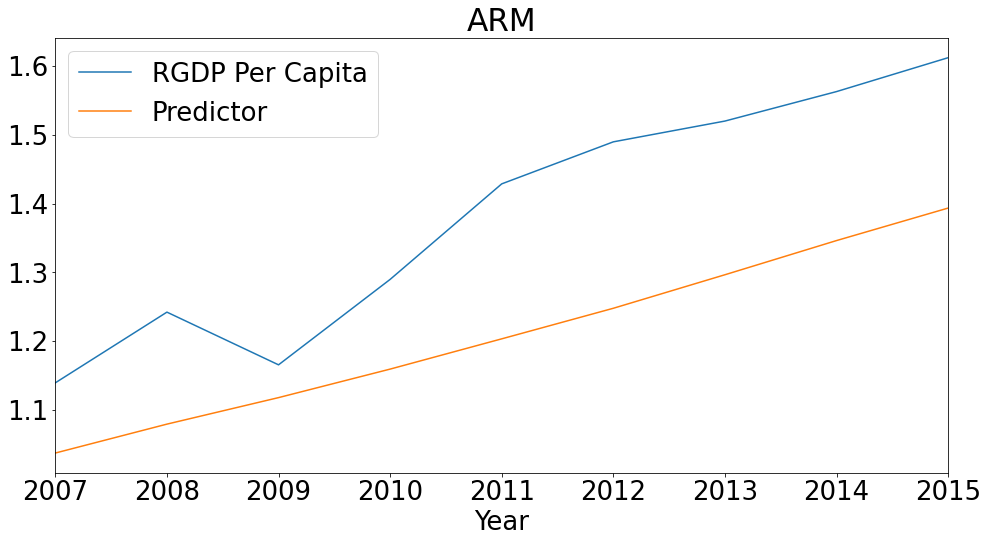

...

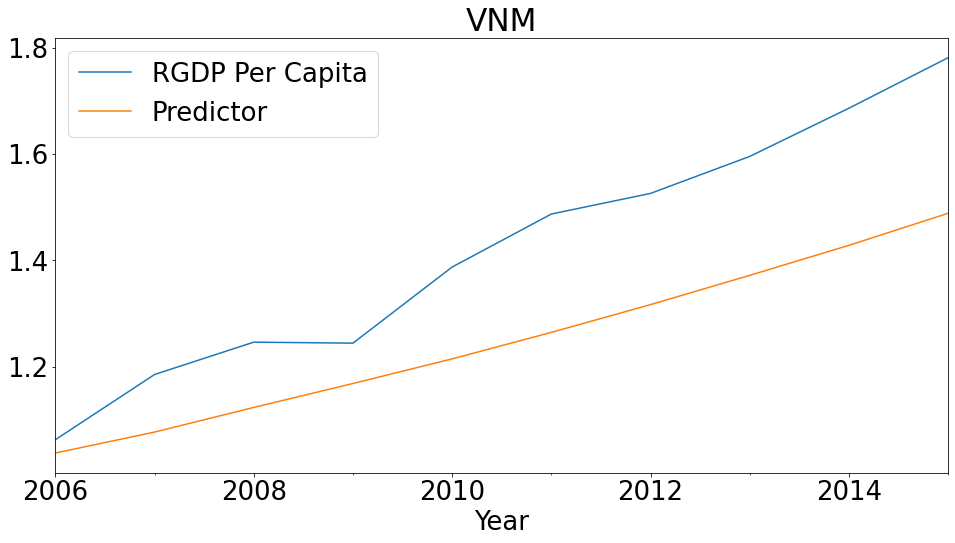

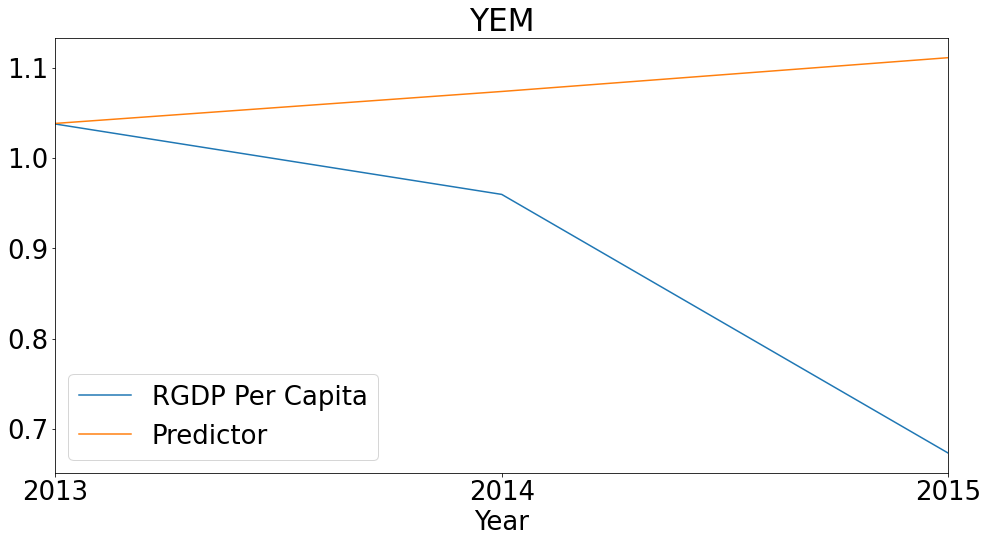

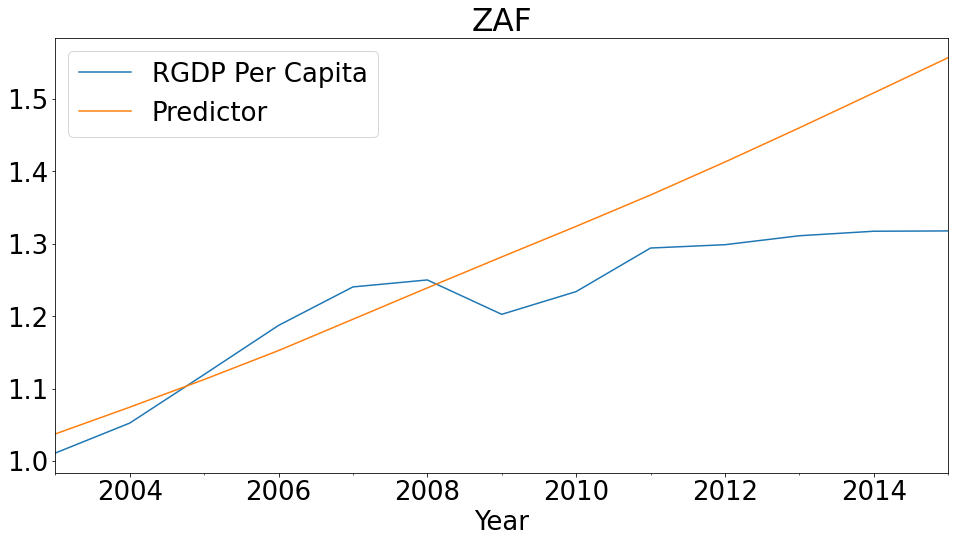

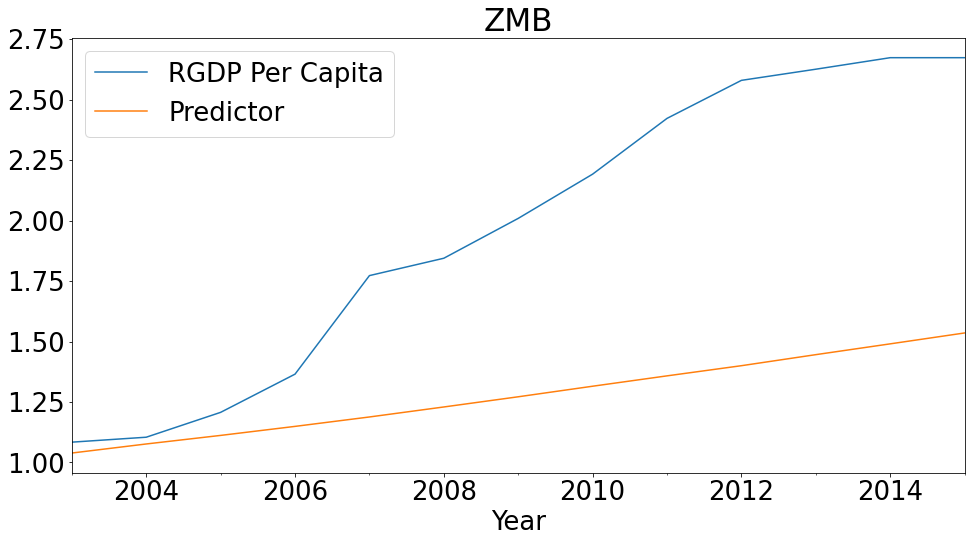

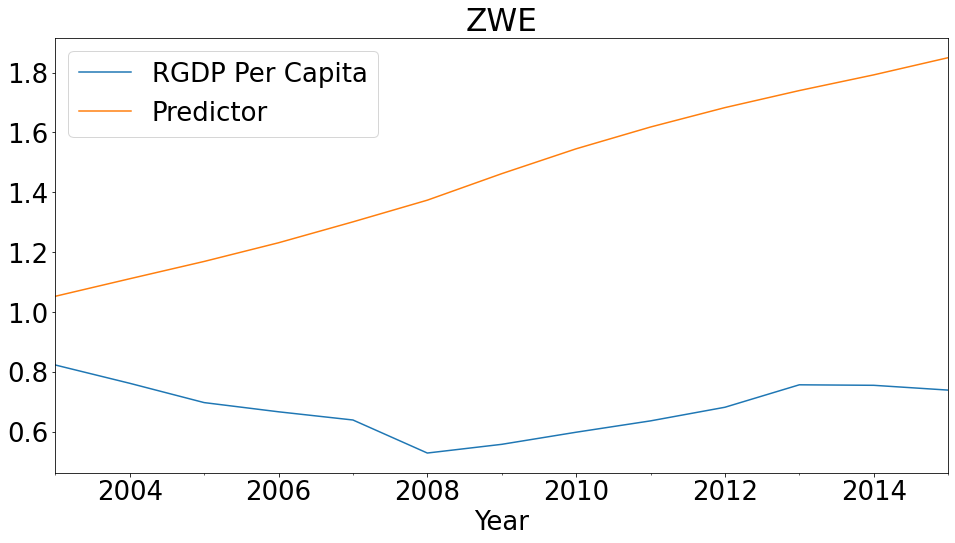

In [39]:
for country in countries:
    fig, ax = plt.subplots(figsize = (16,8))
#put legends on to make shure it was easy to understand everything 
    plot_data[y_var + ["Predictor"]].loc[country].cumprod().plot.line(ax = ax, legend = True)
    
    ax.set_title(country)
    plt.plot()

In [40]:
y_var = ["RGDP Per Capita"]
x_vars = ["Size of Government", 
          "Legal System & Property Rights", 
          "Sound Money",
          "Freedom to trade internationally",
         "Regulation"]

y = reg_data[PerCap]
X = reg_data[SizeFree]
# sets x to a constant of 1
results = sm.OLS(y, X).fit()
reg_data["Predictor"] = results.predict()

In [41]:
results.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        RGDP Per Capita   R-squared (uncentered):                   0.221
Model:                            OLS   Adj. R-squared (uncentered):              0.219
Method:                 Least Squares   F-statistic:                              96.30
Date:                Thu, 16 Dec 2021   Prob (F-statistic):                    1.75e-89
Time:                        18:45:16   Log-Likelihood:                          2175.7
No. Observations:                1703   AIC:                                     -4341.
Df Residuals:                    1698   BIC:                                     -4314.
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Size of Government                   0.0047      0.001      3.359      0.001       0.002       0.008
Legal System & Property Rights      -0.0016      0.002     -1.042      0.298      -0.005       0.001
Sound Money                         -0.0044      0.002     -2.558      0.011      -0.008      -0.001
Freedom to trade internationally     0.0035      0.003      1.357      0.175      -0.002       0.008
Regulation                           0.0034      0.002      1.582      0.114      -0.001       0.008
==============================================================================
Omnibus:                      231.542   Durbin-Watson:                   1.619
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2754.777
Skew:                           0.103   Prob(JB):                         0.00
Kurtosis:                       9.227   Cond. No.                         27.5
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<AxesSubplot:ylabel='Frequency'>

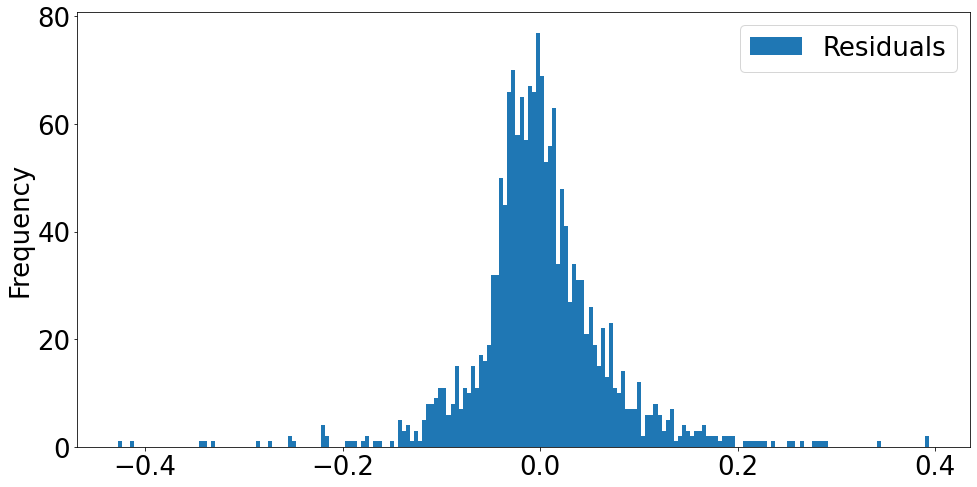

In [43]:
reg_data["Residuals"] = results.resid
fig, ax = plt.subplots(figsize = (16,8))
reg_data[["Residuals"]].plot.hist(bins = 200, ax = ax)

In [44]:
betaEstimates = results.params
tStats = results.tvalues
pValues = results.pvalues
stdErrors = results.bse

resultsDict = {"Beta Estimates" : betaEstimates,
              "t-stats":tStats,
              "p-values":pValues,
              "Standard Errors":stdErrors}
resultsDF = pd.DataFrame(resultsDict)
resultsDF.round(4)

,Beta Estimates,t-stats,p-values,Standard Errors
Size of Government,0.0047,3.3588,0.0008,0.0014
Legal System & Property Rights,-0.0016,-1.0416,0.2978,0.0015
Sound Money,-0.0044,-2.5576,0.0106,0.0017
Freedom to trade internationally,0.0035,1.3566,0.1751,0.0026
Regulation,0.0034,1.5824,0.1137,0.0021


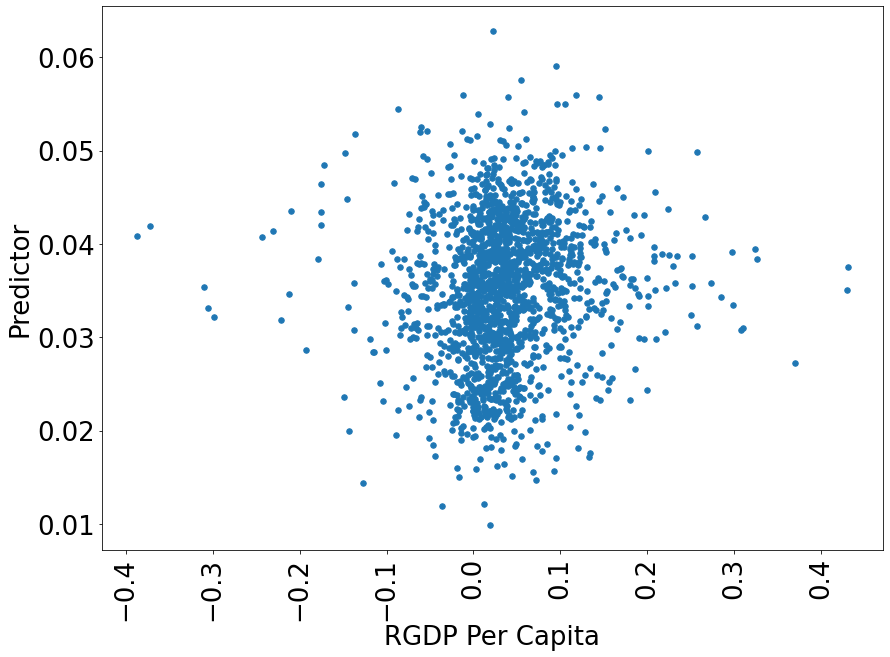

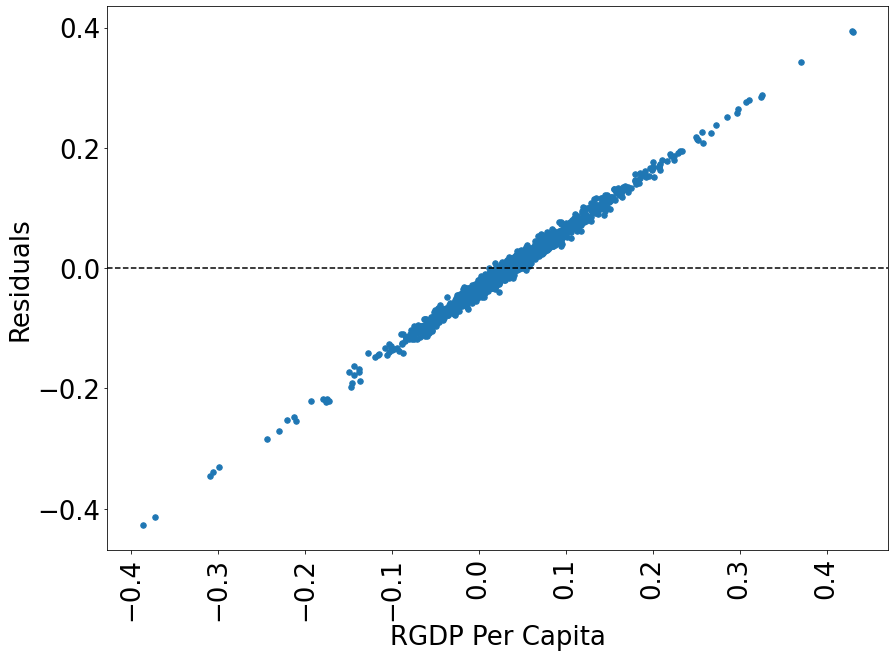

In [45]:
fig, ax = plt.subplots(figsize = (14,10))
reg_data.plot.scatter(x = y_var[0],
                 y = "Predictor", 
                  s = 30, ax = ax)
plt.xticks(rotation=90)
plt.show()
plt.close()

fig, ax = plt.subplots(figsize = (14,10))
reg_data.plot.scatter(x = y_var[0],
                 y = "Residuals", 
                  s = 30, ax = ax)
ax.axhline(0, ls = "--", color = "k")
plt.xticks(rotation=90)
plt.show()
plt.close()